Populating the interactive namespace from numpy and matplotlib


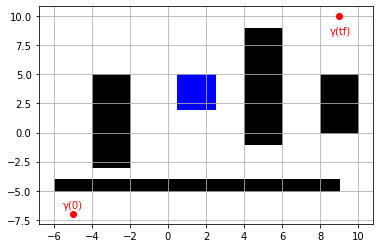

In [20]:
%pylab inline
import matplotlib.pyplot as plt

def draw_environment():
    fig = plt.figure()
    ax = plt.subplot(111)

    rect1 = matplotlib.patches.Rectangle((4,-1), 2, 10, color='black')
    rect2 = matplotlib.patches.Rectangle((-6,-5), 15, 1, color='black')
    rect3 = matplotlib.patches.Rectangle((8,0), 2, 5, color='black')
    rect4 = matplotlib.patches.Rectangle((-4,-3), 2, 8, color='black')
    blue_rect = matplotlib.patches.Rectangle((0.5,2), 2, 3, color='blue')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(blue_rect)

    plt.plot(-5, -7, 'o', color='r')
    plt.plot(9, 10, 'o', color='r')
    plt.text(-5.5, -6.5,'γ(0)', color='r')
    plt.text(8.5, 8.5,'γ(tf)', color='r')
    
draw_environment()
grid()

In [21]:
def point_to_point_traj(x1, x2, delta_t):
    t = np.linspace(0, delta_t, 100)
    a0 = x1
    a1 = (x2 - x1) / delta_t
    
    polynomial = a0 + a1 * t
    
    return polynomial

def piecewise2D (X, Y, T):
    theta_x, theta_y = [], []

    for i in range(len(P)-1):          
        theta_xi = point_to_point_traj(X[i], X[i+1], T[i+1] - T[i])
        theta_yi = point_to_point_traj(Y[i], Y[i+1], T[i+1] - T[i])

        theta_x += theta_xi.tolist()
        theta_y += theta_yi.tolist()

        plot(theta_xi, theta_yi)
    return theta_x, theta_y

In [22]:
# Waypoints
p1 = [-5,-7]
p2 = [10,-7]
p3 = [10,-2.5]
p4 = [0,-2.5]
p5 = [0,6]
p6 = [3,6]
p7 = [3,1]
p8 = [-1,1]
p9 = [-1,10]
p10 = [9,10]

# Time
t1 = 0
t2 = 10
t3 = 20
t4 = 30
t5 = 40
t6 = 50
t7 = 60
t8 = 70
t9 = 80
t10 = 90

P = np.vstack((p1, p2, p3, p4, p5, p6, p7, p8, p9, p10))
T = [t1, t2, t3, t4, t5, t6, t7, t8, t9, t10]

X, Y = P[:,0], P[:,1]

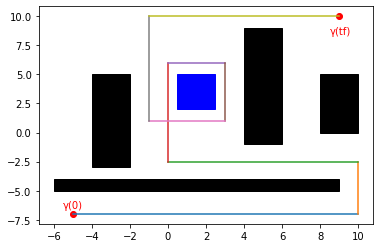

In [23]:
draw_environment()
theta_x, theta_y = piecewise2D(X, Y, T)
plt.show()

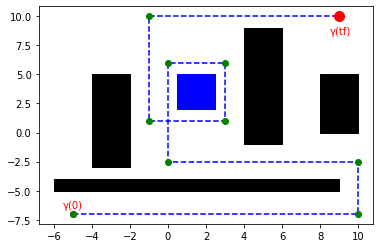

In [11]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

fig = plt.figure()
ax = plt.subplot(111)

def animate(t):
    ax.clear()
    
    rect1 = matplotlib.patches.Rectangle((4,-1), 2, 10, color='black')
    rect2 = matplotlib.patches.Rectangle((-6,-5), 15, 1, color='black')
    rect3 = matplotlib.patches.Rectangle((8,0), 2, 5, color='black')
    rect4 = matplotlib.patches.Rectangle((-4,-3), 2, 8, color='black')
    blue_rect = matplotlib.patches.Rectangle((0.5,2), 2, 3, color='blue')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(blue_rect)

    plt.plot(-5, -7, 'o', color='r')
    plt.plot(9, 10, 'o', color='r')
    plt.text(-5.5, -6.5,'γ(0)', color='r')
    plt.text(8.5, 8.5,'γ(tf)', color='r')
    
    # Path
    ax.plot(theta_x, theta_y, 'b--')
    
    # Initial conditions
    ax.plot(X,Y, 'go')
        
    # Dynamic position
    ax.plot(theta_x[t], theta_y[t], 'ro', markersize=10)
       
anim = animation.FuncAnimation(fig, animate, frames=int(len(theta_x)/1), interval=25)


HTML(anim.to_jshtml())